In [ ]:
pip install porespy

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.7/164.7 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 10.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 37.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.9/23.9 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 13.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 25.4 MB/s eta 0:00:00
  Created wheel for docrep: filename=docrep-0.3.2-py3-none-any.whl size=19876 sha256=d974bad0d25309b06d7c6379ac7a3238b34311c011334dc9354dd618f2022030
  Stored in directory: /root/.cache/pip/wheels/c3/64/48/03c38d8d906159eaa210b3c548fdb590eb3e2a4a5745ae217

In [ ]:
import porespy as ps
from porespy.tools import get_tqdm
from porespy.filters import find_peaks, trim_saddle_points, trim_nearby_peaks
from porespy.tools import randomize_colors
import openpnm as op

import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import linregress
import scipy.ndimage as spim
from sklearn.mixture import GaussianMixture
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit

import skimage
from skimage.morphology import disk
from skimage.segmentation import watershed
from edt import edt
import inspect
import imageio
from copy import copy

op.visualization.set_mpl_style()
ps.visualization.set_mpl_style()
inspect.signature(ps.filters.fftmorphology)
tqdm = get_tqdm()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
height = 1000
width = 1000
depth = 1000
dtype = np.uint8

file_path = '/content/drive/Othercomputers/Meu Mac/Desktop/AFP/Rocha Digital/Berea_2d25um_grayscale.raw'
berea = np.fromfile(file_path, dtype=dtype).reshape((depth, height, width))


berea_cut = berea[:250, :250, :250]
binary_berea_cut = np.where(berea_cut < 13, True, False)
poros_berea_cut = np.where(berea_cut > 13, True, False)

# PoreSpy - Geometric & Image Based

## BEREA 2D

### Visualização

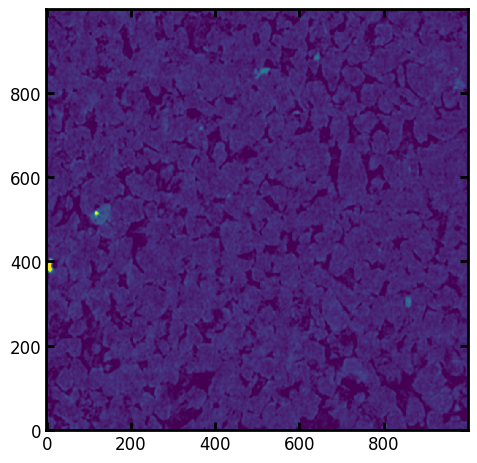

In [ ]:
berea_2D = berea[:, :, 20]
plt.imshow(berea_2D)

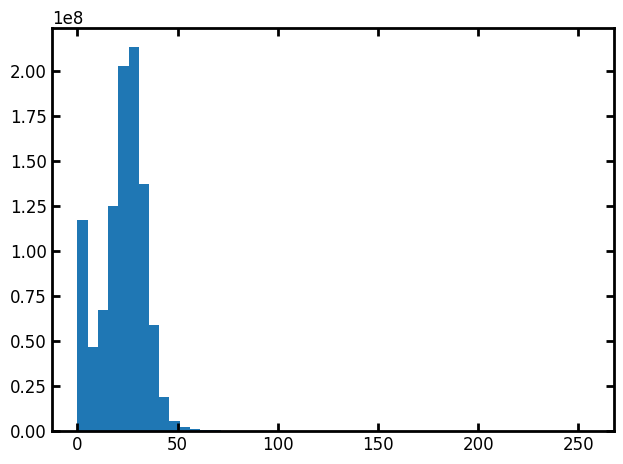

In [ ]:
plt.hist(berea.reshape(-1,1), bins=50)
plt.show()

In [ ]:
#Definindo o corte para segmentar porosidade
binary_berea = np.where(berea_2D < 13, 1, 0)

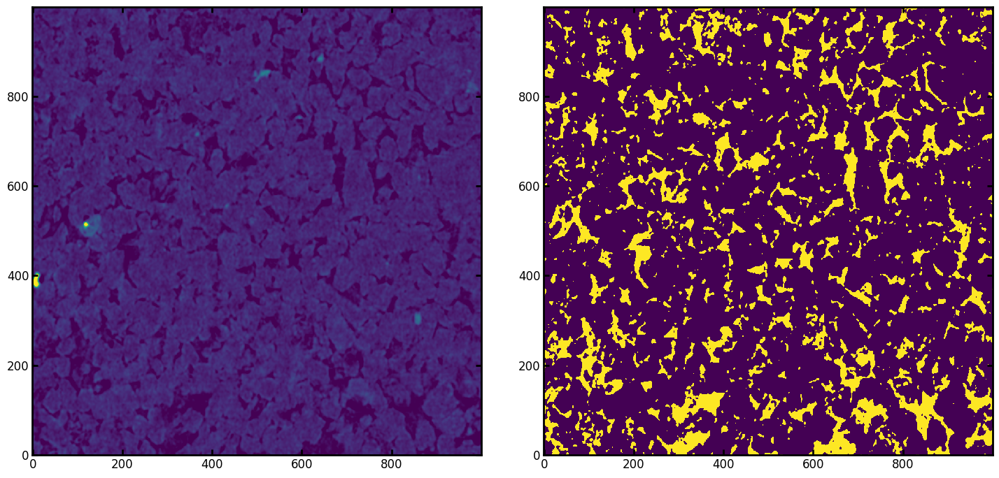

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.imshow(berea_2D)

plt.subplot(1,2,2)
plt.imshow(binary_berea)

(-0.5, 999.5, -0.5, 999.5)

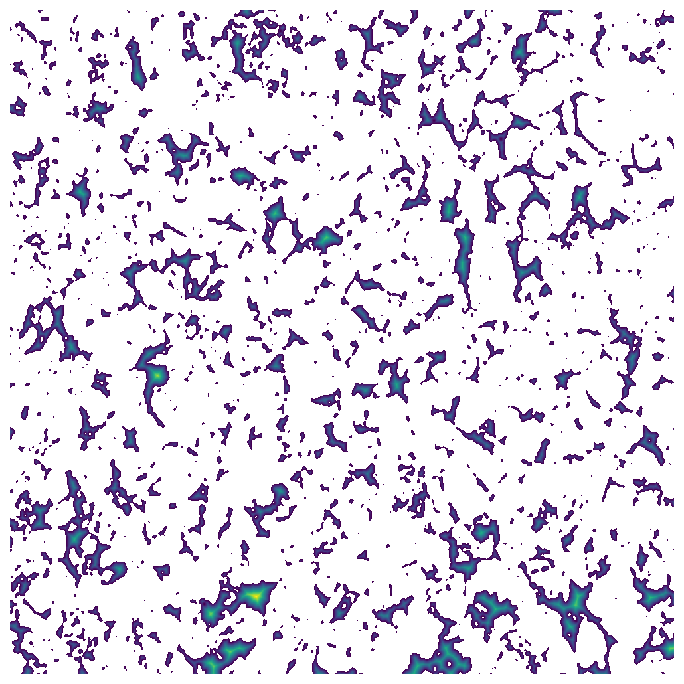

In [ ]:
dt = edt(binary_berea)

plt.figure(figsize=[7, 7])
plt.imshow(dt/binary_berea)
plt.axis(False)

### Simulação de Drenagem

O algorítmo calcula a pressão capilar hipotética considerando o raio da maior esfera centralizada em cada um dos voxels. Para isso é necessário calcular a distância transformada da imagem e então aplicar a equação de Washburn

In [ ]:
sigma = 0.072                                 #Tensão superficial
theta = 180                                   #Ângulo de contato fluido-grão (180 representa fluido completamente não molhante - forma esférica)
g = 9.8                                       #Aceleração da gravidade
delta_rho = 1000                              #Diferença entre a densidade dos fluidos
voxel_size = 1e-4                             #Cada voxel representa um cubo de aresta 0.1mm -> utilizado para calcular o efeito da gravidade

dt = edt(binary_berea)*voxel_size             #Convertendo voxel para metros  -> quanto maior o tamanho de cada voxel, maior será o efeito da gravidade (rho*g*h)


pc = -2*sigma*np.cos(np.deg2rad(theta))/dt    #Equação de Washburn

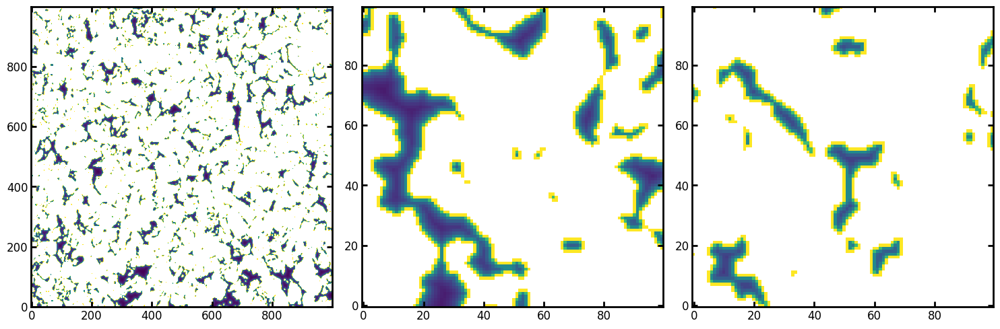

In [ ]:
vmin = pc.min()
vmax = max_value = np.max(pc[np.isfinite(pc)])

plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(pc, origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,2)
plt.imshow(pc[:100, :100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,3)
plt.imshow(pc[900:, :100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)



O resultado sugere que os maiores valores de pressão capilar $P_c$ são encontrados próximas às bordas dos poros, porque apenas esferas pequenas podem ser posicionadas nessas localizações. Porém isso não apresenta significado físico, uma vez que os valores de pressão capilar no interior do poro deve neutralizar esse efeito



É necessário adicionar o efeito da gravidade ao modelo

$P'_c = Pc + \Delta phg$

O que implica no fato de que para que o fluido invada o poro, não é necessário vencer apenas a pressão capilar, mas também o efeito gravitacional

As constantes p e g são facilmente determinadas. No entanto, o valor de h requer um determinado esforço. Uma força de determinar o seu valor utiliza da distância transformada.

In [ ]:
bottom = np.ones_like(binary_berea)                         #Criando array auxiliar
bottom[0, :] = False                                        #Zerando a primeira linha do array
h = (edt(bottom) + 1)*voxel_size                            #Calculando valor de h
pc = pc + delta_rho * g * h                                 #Calculando a pressão capilar considerando o efeito da gravidade considerando variação vertical

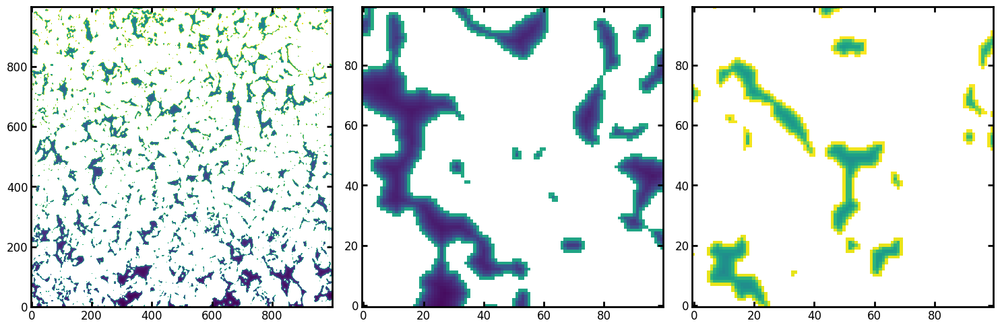

In [ ]:
vmin = pc.min()
vmax = np.max(pc[np.isfinite(pc)])

plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(pc, origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,2)
plt.imshow(pc[:100, :100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,3)
plt.imshow(pc[900:, :100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

É possível observar um gradiente de pressão causado pelo efeito da gravidade de tal forma que a pressão para invasão seja maior nas porções superiores.

Agora iremos realizar a injeção do fluido não molhante pela base da imagem aplicando uma pressão igual a metade da mediana da pressão do modelo!

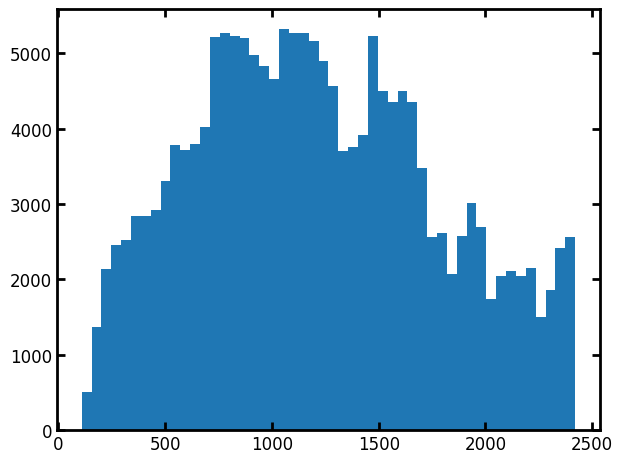

In [ ]:
pc_reshaped = pc.reshape(int(1e6),)                       #Redimensionando o array pc para plotar o histograma
pc_reshaped = (pc_reshaped[np.isfinite(pc_reshaped)])     #Eliminando os valores de pressão capilar infinitos

plt.hist(pc_reshaped, bins=50)
plt.show()

PC Applied = 583.8668823242188


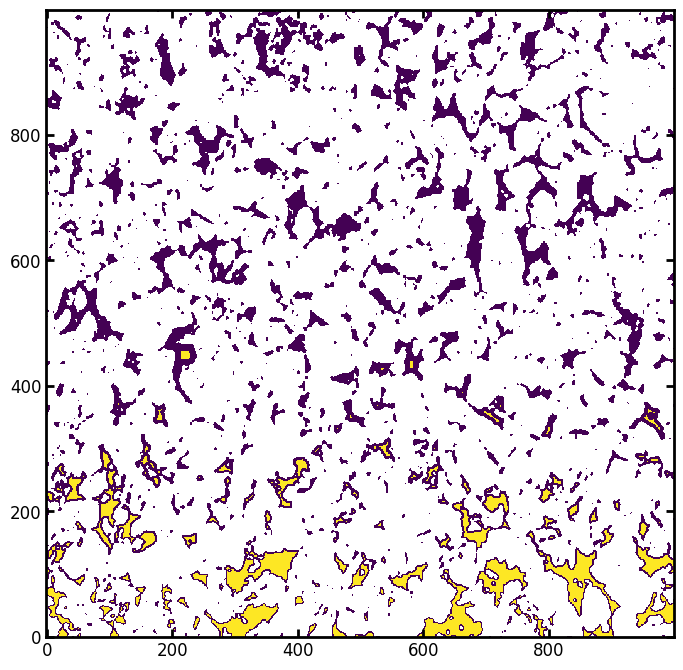

In [ ]:
pc_applied = np.median(pc_reshaped)/2               #Utilizando a mediana do vetor sem valores de pc infinitos
print(f'PC Applied = {pc_applied}')
seeds = pc < pc_applied                             #Avaliando os pontos onde a pressão aplicada é maior que a pc
plt.figure(figsize=(7, 7))
plt.imshow(seeds/binary_berea, origin='lower', interpolation='none')

A região em amarelo representa os voxels que constituem o espaço poroso onde a pressão de entrada era maior que a pressão capilar. No entanto, algumas regiões representam porções isoladas que podem ser geradas pelo fato de que o efeito da gravidade era baixo o suficiente para não dificultar a entrada do fluido não molhante ou o poro era largo o suficiente para favorecer a entrada do fluido não molhante. No entanto, essas regiões não estão conectadas a fonte do fluido não molhante. Dessa forma, é necessário eliminar esses poros não conectados manualmente ou utilizando a função *trim_disconected_voxels* da biblioteca porespy.

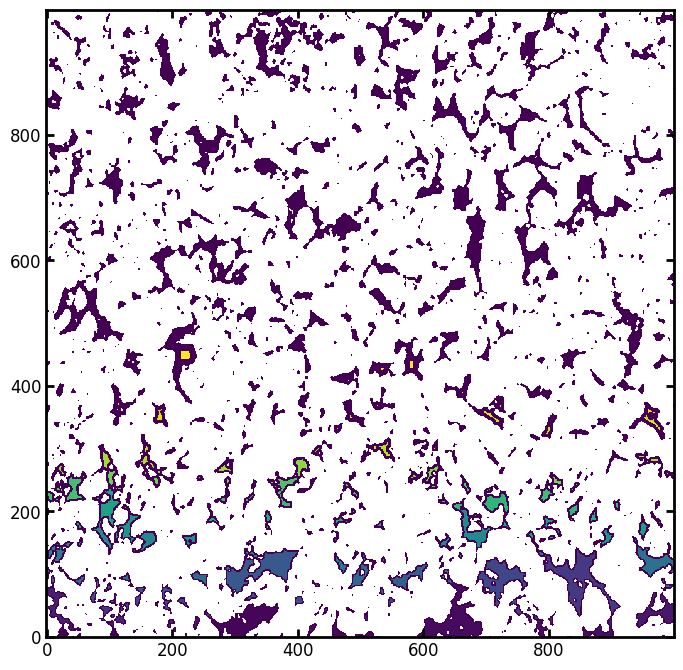

In [ ]:
labels = spim.label(seeds)[0]
plt.figure(figsize=[7, 7])
plt.imshow(labels/binary_berea, origin='lower', interpolation='none')

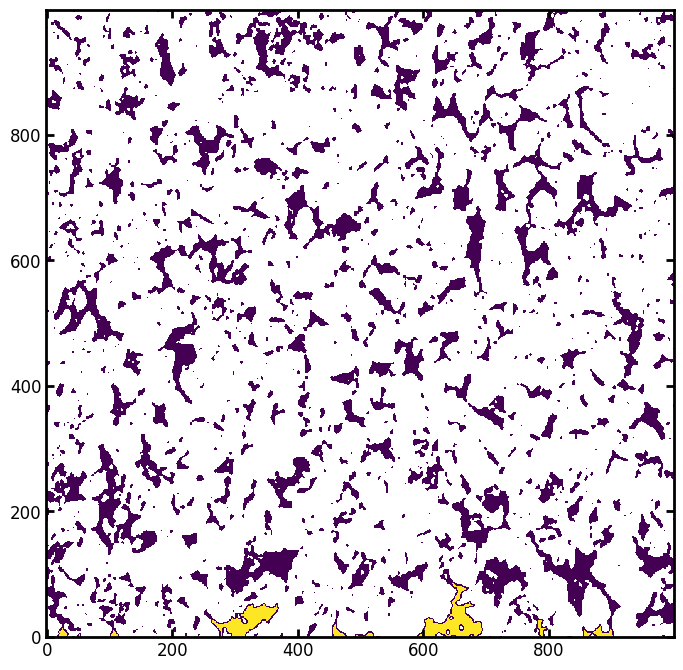

In [ ]:
keep = np.unique(labels[0, ...])
keep = keep[keep > 0]  # Remover zeros
seeds = np.isin(labels, keep)
plt.figure(figsize=[7, 7])
plt.imshow(seeds/binary_berea, origin='lower', interpolation='none')

Com os poros desconectados removidos, é necessário converter esse resultado em uma configuração do arranjo dos fluidos ajustando esferas em cada um dos voxels amarelos para determinar o diâmetro da maior esfera possível centrada no voxel em questão. Dessa forma, cada voxel amarelo será tratado de maneira individual.

In [ ]:
blobs = np.zeros_like(binary_berea)
hits = np.where(seeds)
for loc in tqdm(range(len(hits[0]))):
    i, j = hits[0][loc], hits[1][loc]
    r = int(dt[i, j]/voxel_size) # Converter de volta em voxels
    ps.tools.insert_sphere(im=blobs, c=np.hstack([[i, j]]), r=r, v=True)

100%|██████████| 5993/5993 [00:05<00:00, 1126.60it/s]


O iterador *for* nativo do Python é um tanto quanto lento. Existe a possibilidade de acelerar o processo utilizando estratégias como utilizar o pacote numba. Utilizar o for não é recomendado para aplicações!

Avaliar como otimizar!

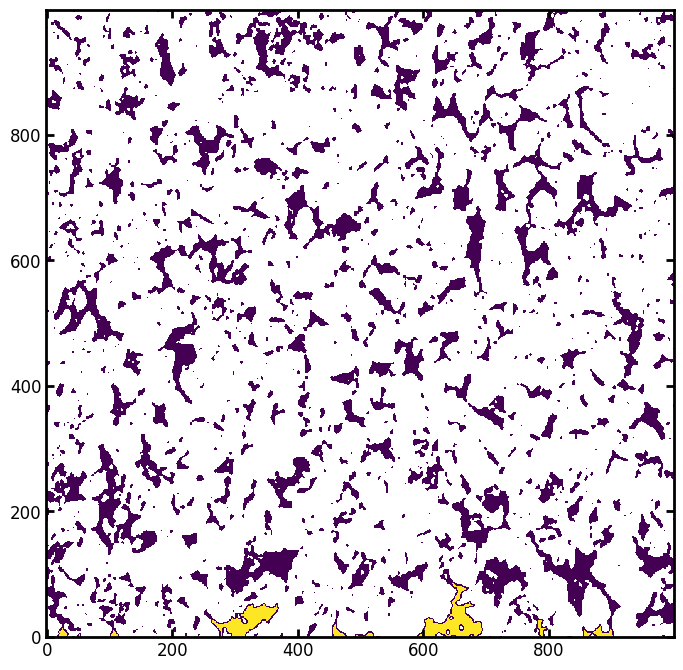

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow((seeds*1.0 + blobs*1.0)/binary_berea, origin='lower')

Agora é possível realizar o cálculo de saturação da imagem para gerar um ponto para a curva de pressão capilar. Para uma determinada pressão capilar, teremos um valor de saturação associado.

In [ ]:
satn = blobs.sum()/binary_berea.sum()
print(pc_applied, satn)

583.8668823242188 0.0


Para gerar a curva de saturação completa, ou pseudo-saturação já que a pressão capilar varia com a altura, é necessário utilizar a diferença de pressão entre a base e o topo do domínio e variar progressivamente os valores aplicados de pc_applied.

Será necessário reduzir o domínio porque a simulação consome muita memória e acaba falhando.

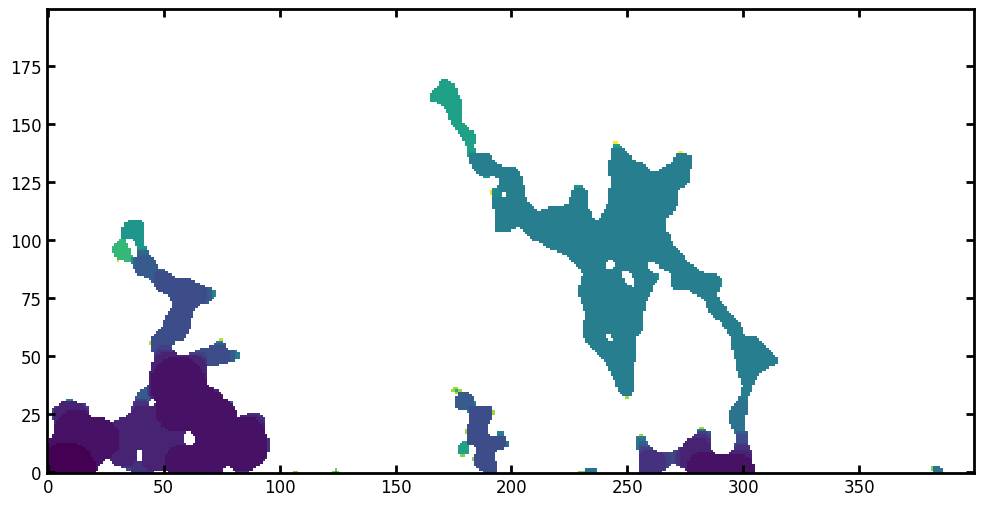

In [ ]:
binary_berea_cropped = binary_berea[:200, 600:]
pc_cropped = pc[:200, 600:]

pc1 = ps.simulations.drainage(pc=pc_cropped, im=binary_berea_cropped, voxel_size=voxel_size)
plt.figure(figsize=[10,10])
plt.imshow(pc1.im_pc/binary_berea_cropped, origin='lower');

A imagem apresenta a pressão capilar de entrada para cada voxel incluindo o impacto da altura e da conectividade processada manualmente anteriormente. Essa imagem pode ser utilizada para determinar a curva de pseudo pressão capilar!

In [ ]:
pc_curve = ps.metrics.pc_curve(pc=pc1.im_pc, im=binary_berea_cropped)
print(pc_curve)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Results of pc_curve generated at Mon Sep 16 12:48:21 2024
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
pc                        Array of size (11,)
snwp                      [995.4035605613334, 995.4035605613334, 1071.701303419774, 1275.2622734910758, 1284.2622734910758, 1370.726145601526, 1371.726145601526, 1397.5255007039375, 1430.224533357555, 1432.8577592079569, 1453.2903401607703]
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


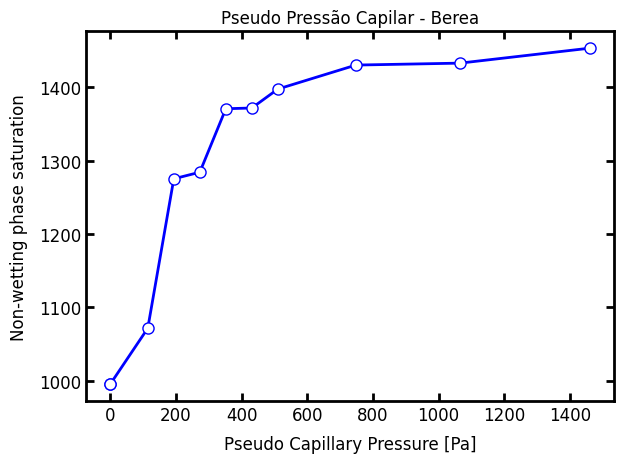

In [ ]:
plt.plot(pc_curve.pc, pc_curve.snwp, 'b-o')
plt.xlabel('Pseudo Capillary Pressure [Pa]')
plt.ylabel('Non-wetting phase saturation')
plt.title('Pseudo Pressão Capilar')
plt.show()

Os valores de saturação estão estranhos...

In [ ]:
bd = np.zeros_like(binary_berea_cropped, dtype=bool)
bd = bd.astype(int)                                      #Foi necessário converter o array booleano para um array 0,1
bd[0:2, :] = 1                                           #Definir injeção a partir da base
bd[-2:, :] = 1
# bd *= binary_berea_cropped

In [ ]:
bd

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

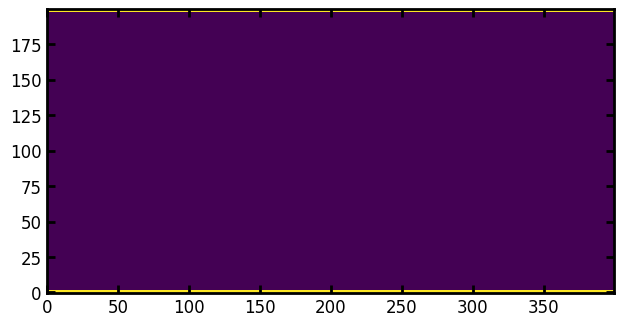

In [ ]:
plt.imshow(bd)

<ipython-input-53-1111d2c49e25>:1: DeprecationWarning: Call to deprecated function (or staticmethod) ibip. (The ibip function will be moved to the ``simulations`` module in a future version)
  out = ps.filters.ibip(im=binary_berea_cropped, inlets=bd, maxiter=15000)


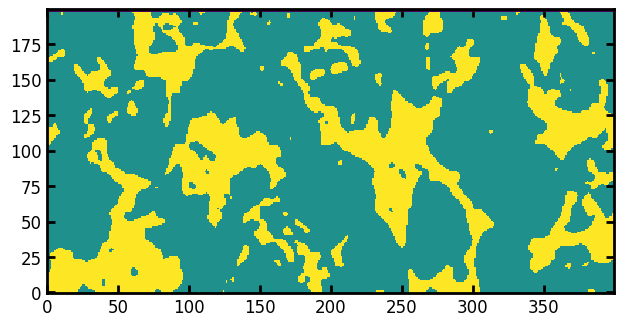

In [ ]:
out = ps.filters.ibip(im=binary_berea_cropped, inlets=bd, maxiter=15000)
inv_seq, inv_size = out.inv_sequence, out.inv_sizes
plt.imshow(inv_seq)

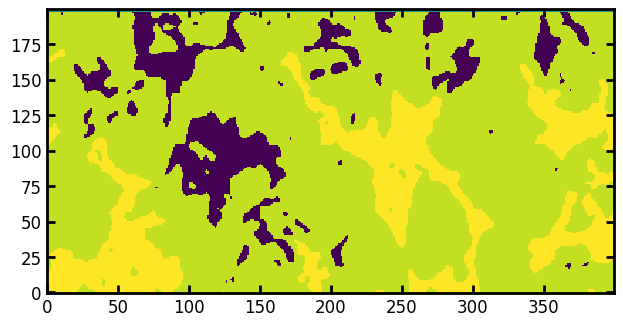

In [ ]:
inv_satn = ps.filters.seq_to_satn(seq=inv_seq)
inv_seq_trapping = ps.filters.find_trapped_regions(seq=inv_seq, bins=None,
                                                   return_mask=False)
inv_satn_trapping = ps.filters.seq_to_satn(seq=inv_seq_trapping)
plt.imshow(inv_satn_trapping)

In [ ]:
sizes = np.arange(int(dt.max())+1, 0, -1)
mio = ps.filters.porosimetry(im=binary_berea_cropped, inlets=bd, sizes=sizes, mode='mio')
mio_seq = ps.filters.size_to_seq(mio)
mio_seq[binary_berea_cropped*(mio_seq == 0)] = -1  # Adjust to set uninvaded to -1
mio_satn = ps.filters.seq_to_satn(mio_seq)
mio_seq_trapping = ps.filters.find_trapped_regions(seq=mio_seq, bins=None,
                                                   return_mask=False)

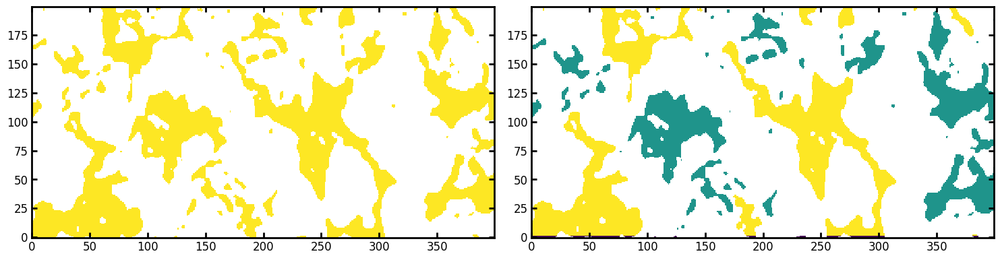

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.imshow(inv_satn/binary_berea_cropped, origin='lower', interpolation='none')

plt.subplot(1,2,2)
plt.imshow(mio_satn/binary_berea_cropped, origin='lower', interpolation='none')

In [ ]:
inv_satn_t = np.around(inv_satn, decimals=4)
mio_satn_t = np.around(mio_satn, decimals=4)
satns = np.unique(mio_satn_t)[1:]
err = []
diff = np.zeros_like(binary_berea_cropped, dtype=float)
for s in satns:
    ip_mask = (inv_satn_t <= s) * (inv_satn_t > 0)
    mio_mask = (mio_satn_t <= s) * (mio_satn_t > 0)
    diff[(mio_mask == 1)*(ip_mask == 0)*(binary_berea_cropped == 1)] = 1
    diff[(mio_mask == 0)*(ip_mask == 1)*(binary_berea_cropped == 1)] = -1
    err.append((mio_mask != ip_mask).sum())

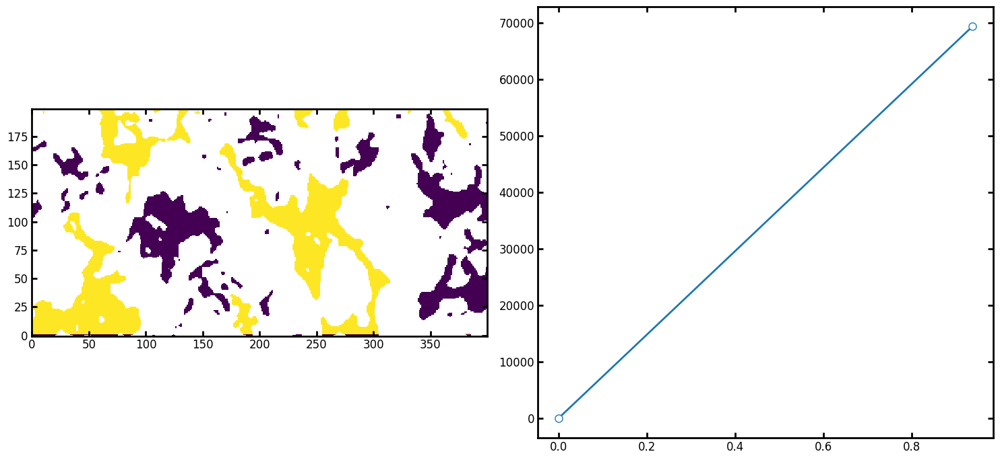

In [ ]:
plt.figure(figsize=[15, 7])

plt.subplot(1,2,1)
plt.imshow(diff/binary_berea_cropped, origin='lower')

plt.subplot(1,2,2)
plt.plot(satns, err, 'o-')

In [ ]:
# from IPython.display import HTML
# %matplotlib notebook
# plt.rcParams["animation.html"] = "jshtml"
# plt.rcParams["animation.embed_limit"] = 100.0
# plt.rcParams["figure.dpi"] = 150

# # Create the animation
# mov = ps.visualization.satn_to_movie(im=binary_berea_cropped, satn=inv_satn)

# # Display the animation
# HTML(mov.to_jshtml())

<IPython.core.display.Javascript object>

## BEREA 3D

### Visualização

In [ ]:
berea_cut = berea[:250, :250, :250]
binary_berea_cut = np.where(berea_cut < 13, True, False)
poros_berea_cut = np.where(berea_cut > 13, True, False)

In [ ]:
im_viz = ps.visualization.show_3D(binary_berea_cut)
im_viz_poros = ps.visualization.show_3D(poros_berea_cut)

Text(0.5, 1.0, 'Poros')

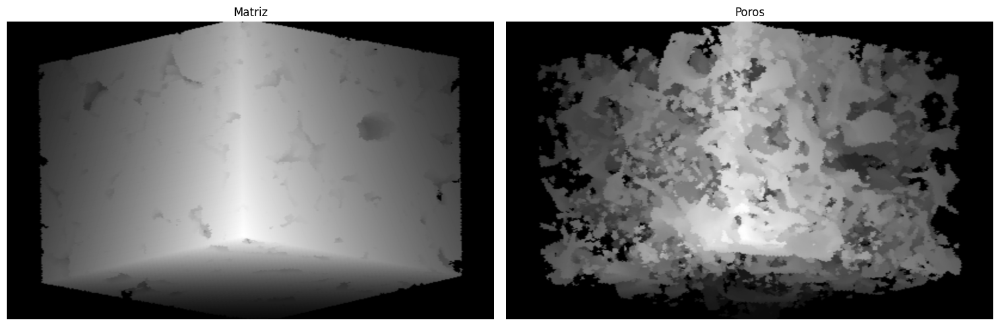

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(im_viz, cmap='gray', aspect='auto', interpolation='gaussian')
plt.axis(False)
plt.title('Matriz')

plt.subplot(1,2,2)
plt.imshow(im_viz_poros, cmap='gray', aspect='auto', interpolation='gaussian')
plt.axis(False)
plt.title('Poros')

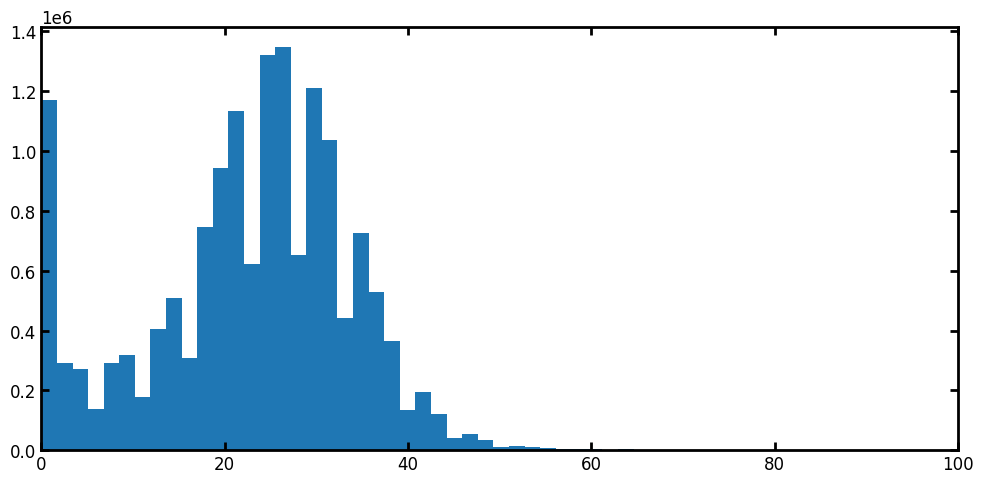

In [ ]:
values = berea_cut.reshape(-1,1)

plt.figure(figsize=[10, 5])
plt.hist(values, bins=150)
plt.xlim(0,100)
plt.show()

In [ ]:
signal = values[values < 60]

# Fit a Gaussian Mixture Model (GMM) with 2 components (for two distributions)
gmm = GaussianMixture(n_components=2)
signal_reshaped = signal.reshape(-1, 1)
gmm.fit(signal_reshaped)

# Get the means and covariances of the two Gaussians
means = gmm.means_.flatten()
covariances = np.sqrt(gmm.covariances_).flatten()

# Sorting by the means (to have a clear order between pore and grain)
sorted_indices = np.argsort(means)
means = means[sorted_indices]
covariances = covariances[sorted_indices]

# Plotting the histogram of the signal with the two Gaussians
x = np.linspace(0, 255, 1000)
gaussian1 = (1/(covariances[0] * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - means[0]) / covariances[0])**2)
gaussian2 = (1/(covariances[1] * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - means[1]) / covariances[1])**2)

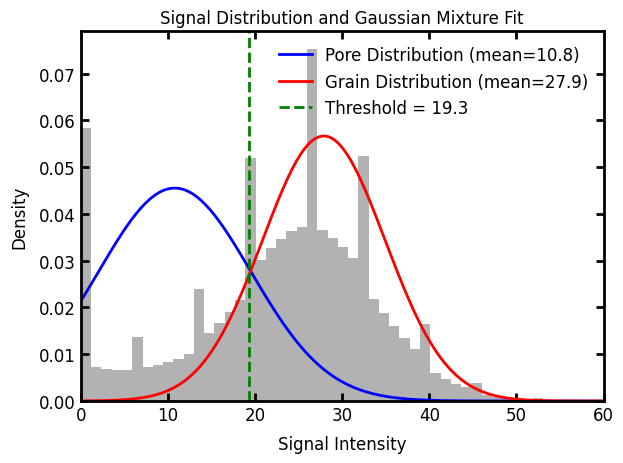

The threshold to separate pores and grains is approximately 19.3


In [ ]:
# Plot signal distribution and GMM fit
plt.hist(signal, bins=50, density=True, alpha=0.6, color='gray')
plt.plot(x, gaussian1, label=f'Pore Distribution (mean={means[0]:.1f})', color='blue')
plt.plot(x, gaussian2, label=f'Grain Distribution (mean={means[1]:.1f})', color='red')

# Find the threshold where the two Gaussians intersect
threshold = (means[0] + means[1]) / 2  # Approximation for intersection point
plt.axvline(threshold, color='green', linestyle='--', label=f'Threshold = {threshold:.1f}')

# Adding labels and legends
plt.title("Signal Distribution and Gaussian Mixture Fit")
plt.xlabel("Signal Intensity")
plt.ylabel("Density")
plt.xlim(0,60)
plt.legend()
plt.show()

print(f"The threshold to separate pores and grains is approximately {threshold:.1f}")

(-0.5, 249.5, -0.5, 249.5)

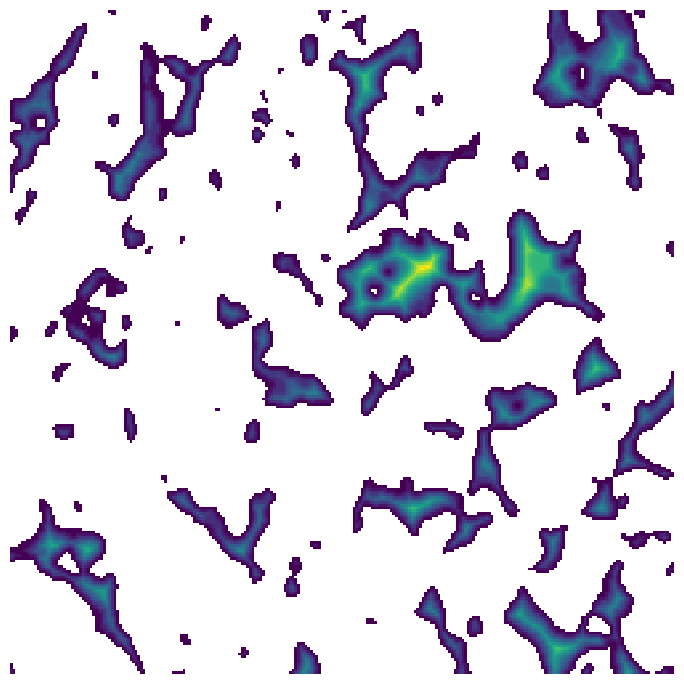

In [ ]:
dt = edt(binary_berea_cut)

plt.figure(figsize=[7, 7])
plt.imshow(dt[:,:,100]/binary_berea_cut[:,:,100])
plt.axis(False)

### Simulação de Drenagem

O algorítmo calcula a pressão capilar hipotética considerando o raio da maior esfera centralizada em cada um dos voxels. Para isso é necessário calcular a distância transformada da imagem e então aplicar a equação de Washburn

In [ ]:
sigma = 0.072                                 #Tensão superficial
theta = 180                                   #Ângulo de contato fluido-grão (180 representa fluido completamente não molhante - forma esférica)
g = 9.8                                       #Aceleração da gravidade
delta_rho = 1000                              #Diferença entre a densidade dos fluidos
voxel_size = 2e-4                             #Cada voxel representa um cubo de aresta 0.2mm -> utilizado para calcular o efeito da gravidade

dt = edt(binary_berea_cut)*voxel_size             #Convertendo voxel para metros  -> quanto maior o tamanho de cada voxel, maior será o efeito da gravidade (rho*g*h)


pc = -2*sigma*np.cos(np.deg2rad(theta))/dt    #Equação de Washburn

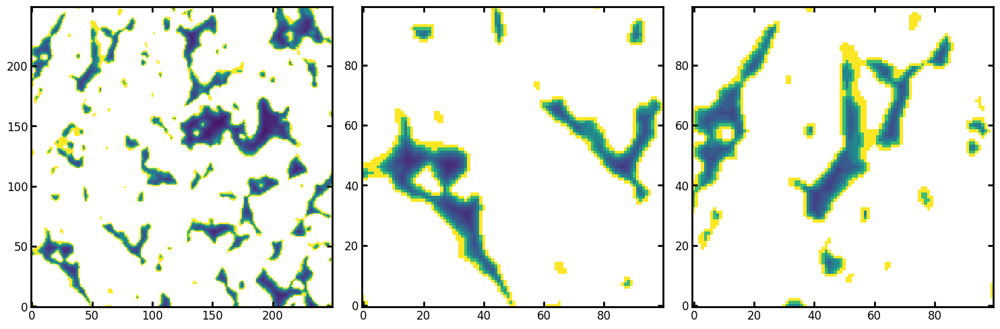

In [ ]:
vmin = pc.min()
vmax = max_value = np.max(pc[np.isfinite(pc)])

plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(pc[:,:,100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,2)
plt.imshow(pc[:100, :100, 100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,3)
plt.imshow(pc[150:, :100, 100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)



O resultado sugere que os maiores valores de pressão capilar $P_c$ são encontrados próximas às bordas dos poros, porque apenas esferas pequenas podem ser posicionadas nessas localizações. Porém isso não apresenta significado físico, uma vez que os valores de pressão capilar no interior do poro deve neutralizar esse efeito



É necessário adicionar o efeito da gravidade ao modelo

$P'_c = Pc + \Delta phg$

O que implica no fato de que para que o fluido invada o poro, não é necessário vencer apenas a pressão capilar, mas também o efeito gravitacional

As constantes p e g são facilmente determinadas. No entanto, o valor de h requer um determinado esforço. Uma força de determinar o seu valor utiliza da distância transformada.

In [ ]:
bottom = np.ones_like(binary_berea_cut)                      #Criando array auxiliar
bottom[0,:,:] = False                                        #Zerando a primeira linha do array
h = (edt(bottom) + 1)*voxel_size                             #Calculando valor de h
pc = pc + delta_rho * g * h                                  #Calculando a pressão capilar considerando o efeito da gravidade considerando variação vertical

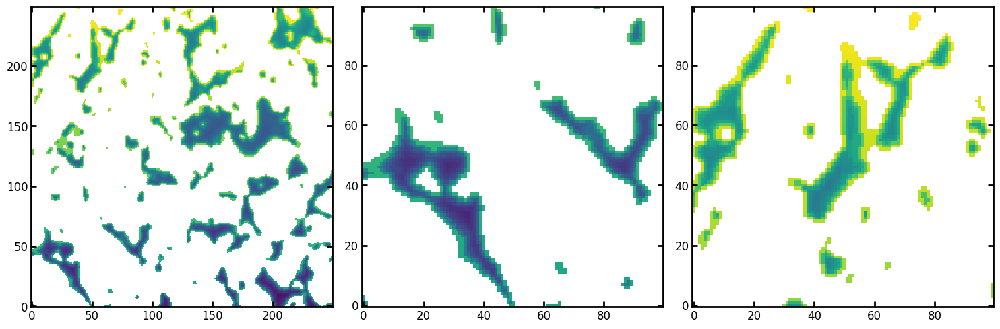

In [ ]:
vmin = pc.min()
vmax = max_value = np.max(pc[np.isfinite(pc)])

plt.figure(figsize=(15,7))

plt.subplot(1,3,1)
plt.imshow(pc[:,:,100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,2)
plt.imshow(pc[:100, :100, 100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

plt.subplot(1,3,3)
plt.imshow(pc[150:, :100, 100], origin='lower', interpolation='none', vmin=vmin, vmax=vmax)

É possível observar um gradiente de pressão causado pelo efeito da gravidade de tal forma que a pressão para invasão seja maior nas porções superiores.

Agora iremos realizar a injeção do fluido não molhante pela base da imagem aplicando uma pressão igual a metade da mediana da pressão do modelo!

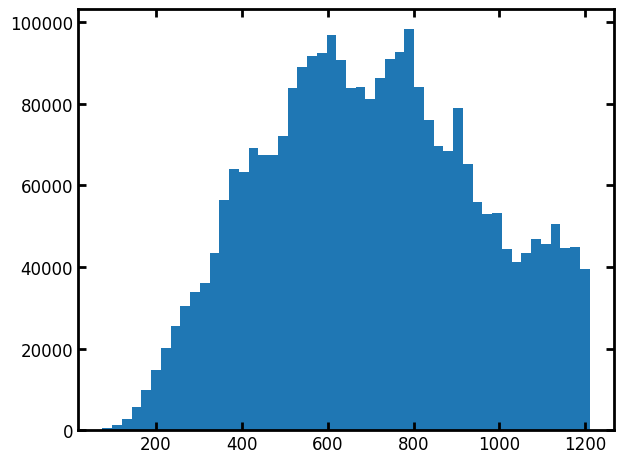

In [ ]:
pc_reshaped = pc.reshape(pc.shape[0]*pc.shape[1]*pc.shape[2],)                       #Redimensionando o array pc para plotar o histograma
pc_reshaped = (pc_reshaped[np.isfinite(pc_reshaped)])     #Eliminando os valores de pressão capilar infinitos

plt.hist(pc_reshaped, bins=50)
plt.show()

PC Applied = 347.986083984375


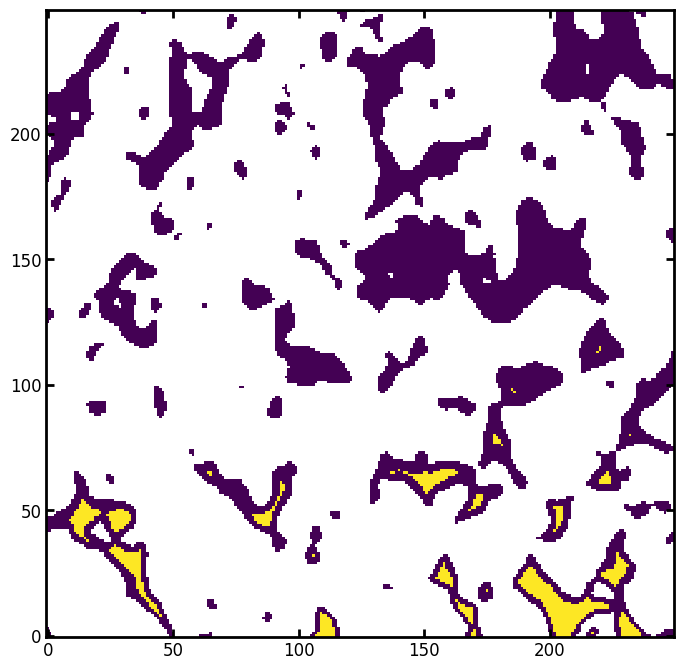

In [ ]:
pc_applied = np.median(pc_reshaped)/2               #Utilizando a mediana do vetor sem valores de pc infinitos
print(f'PC Applied = {pc_applied}')
seeds = pc < pc_applied                             #Avaliando os pontos onde a pressão aplicada é maior que a pc
plt.figure(figsize=(7, 7))
plt.imshow(seeds[:,:,100]/binary_berea_cut[:,:,100], origin='lower', interpolation='none')

A região em amarelo representa os voxels que constituem o espaço poroso onde a pressão de entrada era maior que a pressão capilar. No entanto, algumas regiões representam porções isoladas que podem ser geradas pelo fato de que o efeito da gravidade era baixo o suficiente para não dificultar a entrada do fluido não molhante ou o poro era largo o suficiente para favorecer a entrada do fluido não molhante. No entanto, essas regiões não estão conectadas a fonte do fluido não molhante. Dessa forma, é necessário eliminar esses poros não conectados manualmente ou utilizando a função *trim_disconected_voxels* da biblioteca porespy.

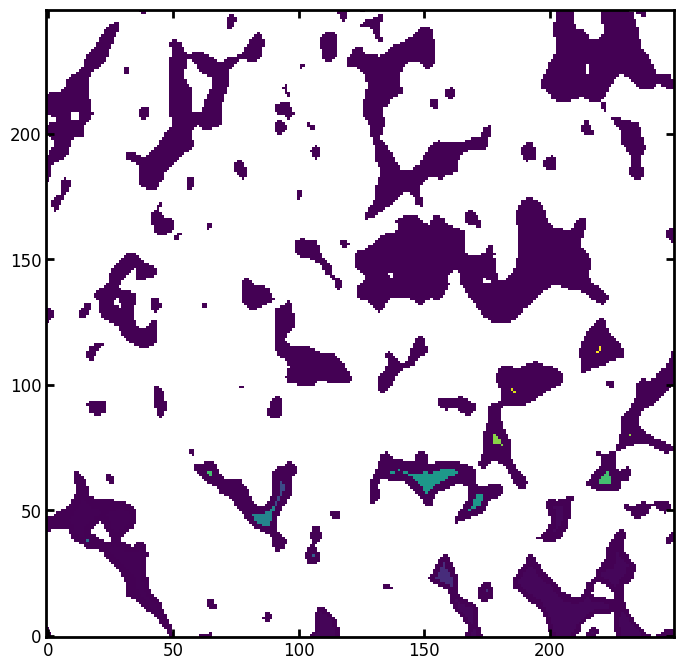

In [ ]:
labels = spim.label(seeds)[0]
plt.figure(figsize=[7, 7])
plt.imshow(labels[:,:,100]/binary_berea_cut[:,:,100], origin='lower', interpolation='none')

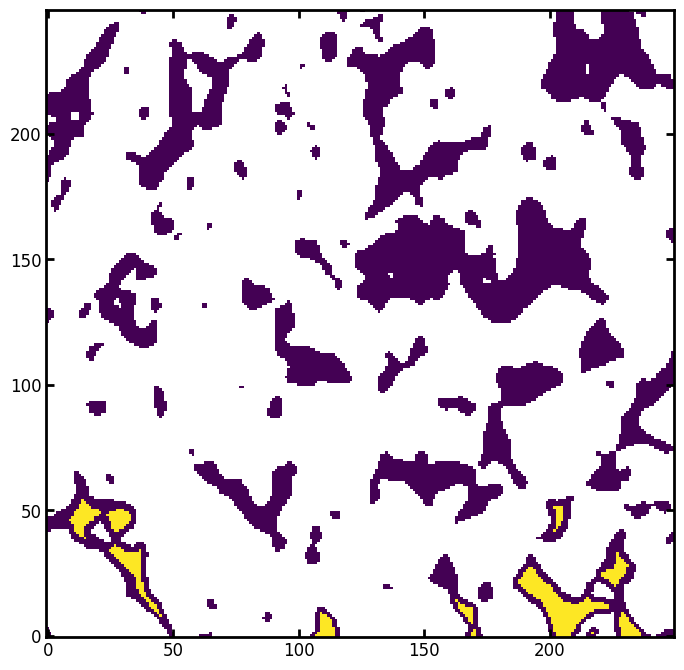

In [ ]:
keep = np.unique(labels[0, ...])
keep = keep[keep > 0]  # Remover zeros
seeds = np.isin(labels, keep)
plt.figure(figsize=[7, 7])
plt.imshow(seeds[:,:,100]/binary_berea_cut[:,:,100], origin='lower', interpolation='none')

Com os poros desconectados removidos, é necessário converter esse resultado em uma configuração do arranjo dos fluidos ajustando esferas em cada um dos voxels amarelos para determinar o diâmetro da maior esfera possível centrada no voxel em questão. Dessa forma, cada voxel amarelo será tratado de maneira individual.

In [ ]:
blobs = np.zeros_like(binary_berea_cut)
hits = np.where(seeds)
for loc in tqdm(range(len(hits[0]))):
    i, j, k = hits[0][loc], hits[1][loc], hits[2][loc]
    r = int(dt[i, j, k]/voxel_size) # Converter de volta em voxels
    ps.tools.insert_sphere(im=blobs, c=np.hstack([[i, j, k]]), r=r, v=True)

100%|██████████| 164119/164119 [00:30<00:00, 5319.63it/s]


O iterador *for* nativo do Python é um tanto quanto lento. Existe a possibilidade de acelerar o processo utilizando estratégias como utilizar o pacote numba. Utilizar o for não é recomendado para aplicações!

Avaliar como otimizar!

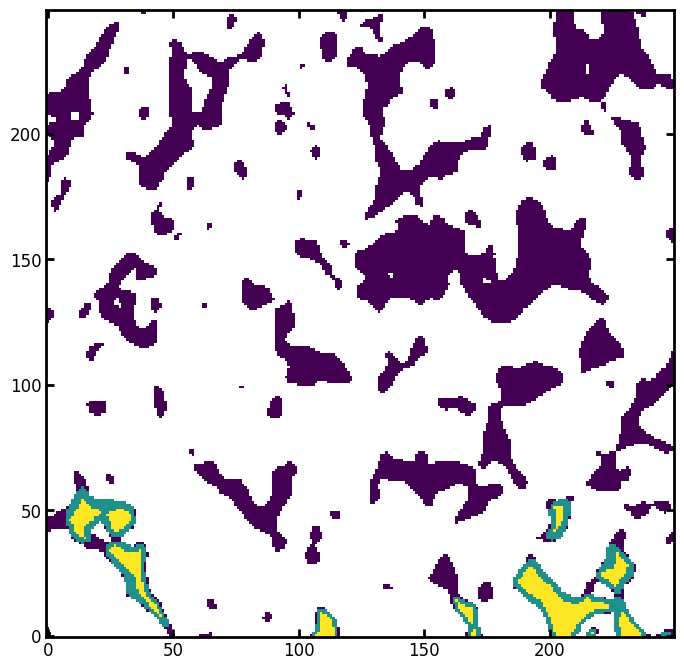

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow((seeds*1.0 + blobs*1.0)[:,:,100]/binary_berea_cut[:,:,100], origin='lower')

Agora é possível realizar o cálculo de saturação da imagem para gerar um ponto para a curva de pressão capilar. Para uma determinada pressão capilar, teremos um valor de saturação associado.

In [ ]:
satn = blobs.sum()/binary_berea_cut.sum()
print(pc_applied, satn)

347.986083984375 0.13143918467423274


Para gerar a curva de saturação completa, ou pseudo-saturação já que a pressão capilar varia com a altura, é necessário utilizar a diferença de pressão entre a base e o topo do domínio e variar progressivamente os valores aplicados de pc_applied.

Será necessário reduzir o domínio porque a simulação consome muita memória e acaba falhando.

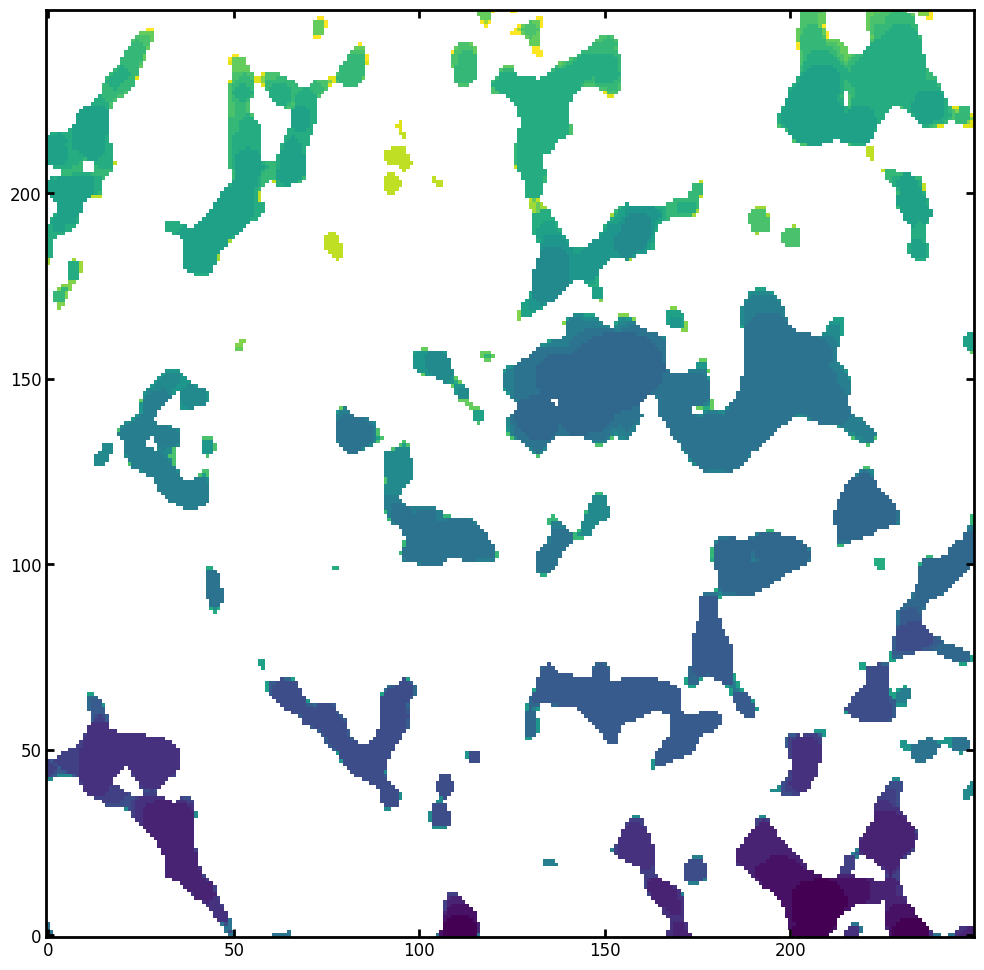

In [ ]:
pc1 = ps.simulations.drainage(pc=pc, im=binary_berea_cut, voxel_size=voxel_size)
plt.figure(figsize=[10,10])
plt.imshow(pc1.im_pc[:,:,100]/binary_berea_cut[:,:,100], origin='lower')

A imagem apresenta a pressão capilar de entrada para cada voxel incluindo o impacto da altura e da conectividade processada manualmente anteriormente. Essa imagem pode ser utilizada para determinar a curva de pseudo pressão capilar!

In [ ]:
pc_curve = ps.metrics.pc_curve(pc=pc1.im_pc, im=binary_berea_cut)
print(pc_curve)

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
Results of pc_curve generated at Mon Sep 16 14:27:37 2024
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
pc                        Array of size (25,)
snwp                      [0.0, 0.0007141641981349651, 0.012068883872902624, 0.032761756437036216, 0.0769887245539543, 0.12023073536814007, 0.1683617543324266, 0.21790391404774306, 0.2819542001869595, 0.3510457279055451, 0.4551288459548526, 0.5141722658051798, 0.5946181624302629, 0.6906430810081782, 0.7818582650650587, 0.8565943557877641, 0.9051210413608406, 0.9289897698433995, 0.9410421676076025, 0.9452461253259953, 0.9521685371384675, 0.9577734633280542, 0.9614182964237421, 0.9643998267204745, 0.9643998267204745]
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――


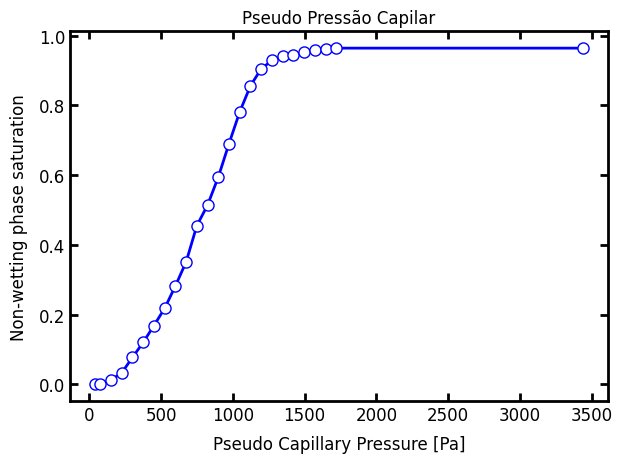

In [ ]:
plt.plot(pc_curve.pc, pc_curve.snwp, 'b-o')
plt.xlabel('Pseudo Capillary Pressure [Pa]')
plt.ylabel('Non-wetting phase saturation')
plt.title('Pseudo Pressão Capilar')
plt.show()

Os valores de saturação estão estranhos...

In [ ]:
bd = np.zeros_like(binary_berea_cut, dtype=bool)
bd = bd.astype(int)                                      #Foi necessário converter o array booleano para um array 0,1
bd[0:5, :, :] = 1                                           #Definir injeção a partir da base
bd[-5:, :, :] = 1                                           #Definir injeção a partir do topo
bd *= binary_berea_cut

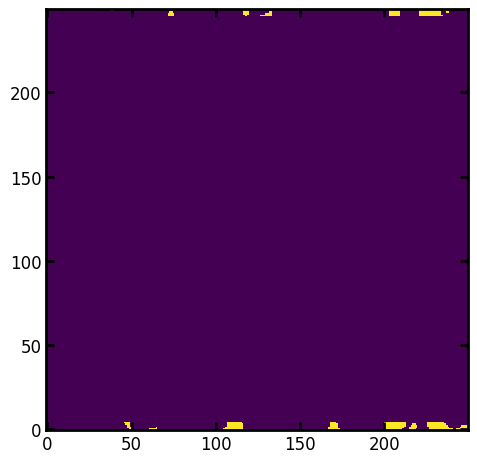

In [ ]:
plt.imshow(bd[:,:,100])

In [ ]:
out = ps.filters.ibip(im=binary_berea_cut, inlets=bd, maxiter=1500)
inv_seq, inv_size = out.inv_sequence, out.inv_sizes

<ipython-input-172-1980ba0c9f53>:1: DeprecationWarning: Call to deprecated function (or staticmethod) ibip. (The ibip function will be moved to the ``simulations`` module in a future version)
  out = ps.filters.ibip(im=binary_berea_cut, inlets=bd, maxiter=1500)


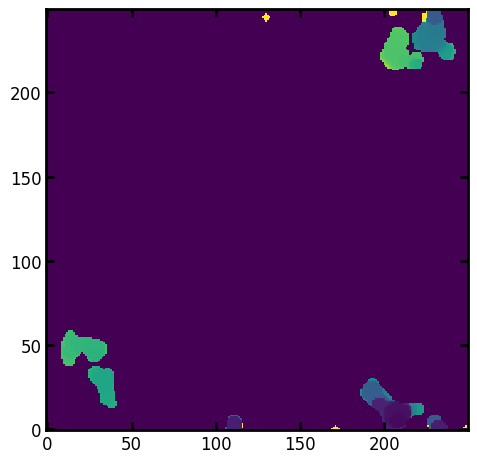

In [ ]:
plt.imshow(inv_seq[:,:,100])

In [ ]:
inv_satn = ps.filters.seq_to_satn(seq=inv_seq)
inv_seq_trapping = ps.filters.find_trapped_regions(seq=inv_seq, bins=None,
                                                   return_mask=False)
inv_satn_trapping = ps.filters.seq_to_satn(seq=inv_seq_trapping)


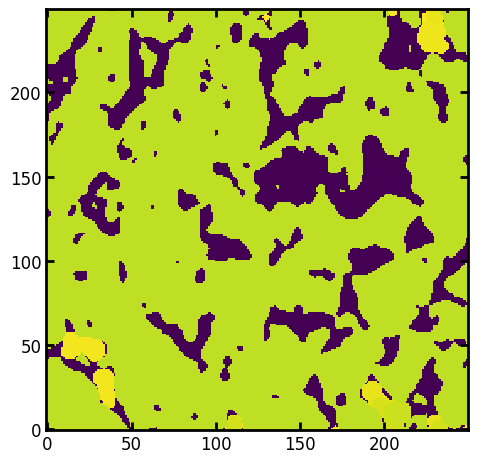

In [ ]:
plt.imshow(inv_satn_trapping[:,:,100])

In [ ]:
sizes = np.arange(int(dt.max())+1, 0, -1)
mio = ps.filters.porosimetry(im=binary_berea_cut, inlets=bd, sizes=sizes, mode='mio')
mio_seq = ps.filters.size_to_seq(mio)
mio_seq[binary_berea_cut*(mio_seq == 0)] = -1  # Adjust to set uninvaded to -1
mio_satn = ps.filters.seq_to_satn(mio_seq)
mio_seq_trapping = ps.filters.find_trapped_regions(seq=mio_seq, bins=None,
                                                   return_mask=False)

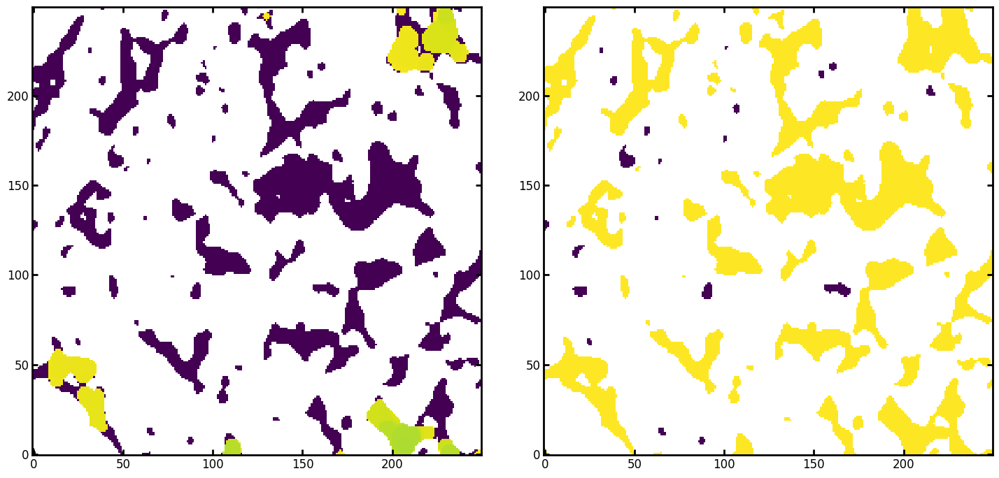

In [ ]:
plt.figure(figsize=(15,7))

plt.subplot(1,2,1)
plt.imshow(inv_satn[:,:,100]/binary_berea_cut[:,:,100], origin='lower', interpolation='none')

plt.subplot(1,2,2)
plt.imshow(mio_satn[:,:,100]/binary_berea_cut[:,:,100], origin='lower', interpolation='none')

In [ ]:
inv_satn_t = np.around(inv_satn, decimals=4)
mio_satn_t = np.around(mio_satn, decimals=4)
satns = np.unique(mio_satn_t)[1:]
err = []
diff = np.zeros_like(binary_berea_cut, dtype=float)
for s in satns:
    ip_mask = (inv_satn_t <= s) * (inv_satn_t > 0)
    mio_mask = (mio_satn_t <= s) * (mio_satn_t > 0)
    diff[(mio_mask == 1)*(ip_mask == 0)*(binary_berea_cut == 1)] = 1
    diff[(mio_mask == 0)*(ip_mask == 1)*(binary_berea_cut == 1)] = -1
    err.append((mio_mask != ip_mask).sum())

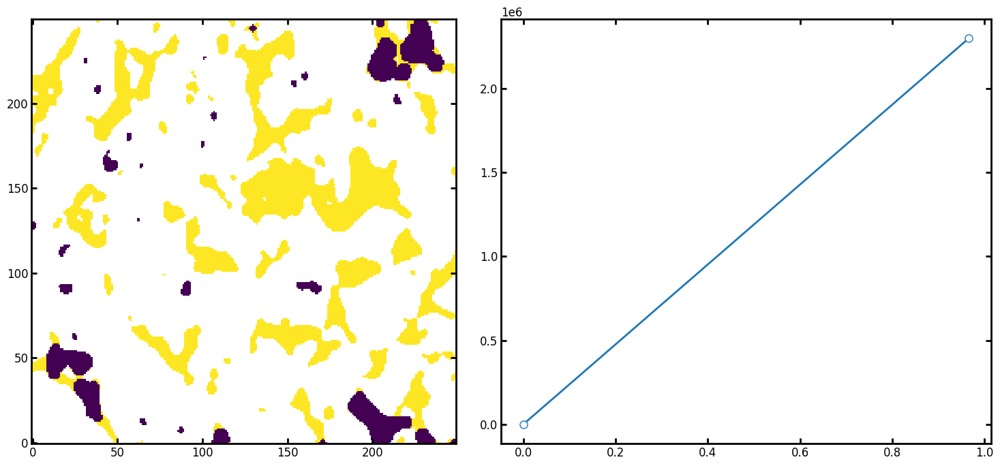

In [ ]:
plt.figure(figsize=[15, 7])

plt.subplot(1,2,1)
plt.imshow(diff[:,:,100]/binary_berea_cut[:,:,100], origin='lower')

plt.subplot(1,2,2)
plt.plot(satns, err, 'o-')

In [ ]:
# from IPython.display import HTML
# %matplotlib notebook
# plt.rcParams["animation.html"] = "jshtml"
# plt.rcParams["animation.embed_limit"] = 100.0
# plt.rcParams["figure.dpi"] = 150

# # Create the animation
# mov = ps.visualization.satn_to_movie(im=binary_berea_cropped, satn=inv_satn)

# # Display the animation
# HTML(mov.to_jshtml())

### Simulação Percolação

In [ ]:
bd = np.zeros_like(binary_berea_cut)
bd = bd.astype(int)
bd[0:5, :, :] = 1
# bd[-5:, :, :] = 1
bd *= binary_berea_cut

In [ ]:
im = ps.filters.trim_disconnected_blobs(im=binary_berea_cut, inlets=bd)
dt = edt(im)

In [ ]:
ibip = ps.simulations.ibip(im=binary_berea_cut, inlets=bd, maxiter=5000)

In [ ]:
inv_satn = ps.filters.seq_to_satn(seq=ibip.inv_sequence)

In [ ]:
# outlets = ps.generators.faces(shape=im.shape, outlet=0)
# sizes = np.unique(pc[pc != 0])
# mio = ps.simulations.drainage(
#     im=im,
#     inlets=bd,
#     bins=sizes,
#     voxel_size=voxel_size,
#     delta_rho=delta_rho,
#     g=g,
#     sigma=sigma,
#     theta = theta
# )
# mio_seq = ps.filters.satn_to_seq(mio.im_satn)
# mio_seq[im*(mio_seq == 0)] = -1  # Adjust to set uninvaded to -1
# mio_satn = ps.filters.seq_to_satn(mio_seq)

In [ ]:
from IPython.display import HTML
%matplotlib notebook
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams["animation.embed_limit"] = 100.0
plt.rcParams["figure.dpi"] = 150

# Create the animation
mov = ps.visualization.satn_to_movie(im=binary_berea_cut[:,:,200], satn=inv_satn[:,:,200])

# Display the animation
HTML(mov.to_jshtml())

<IPython.core.display.Javascript object>

# OpenPNM - Geometric & Numerical

https://openpnm.org/_examples/tutorials.html

## Convertendo Imagem em uma Rede de Poros e Gargantas

In [ ]:
#Encontrando picos ~poros utilizando um algoritmo de watershed SNOW (Sub-Network Over-Segmented Watershed)

sigma = 0.4                                                           #Desvio padrão para o Kernel Gaussiano
dt = spim.distance_transform_edt(input=binary_berea_cut)                     #Distância transformada
dt1 = spim.gaussian_filter(input=dt, sigma=sigma)                     #Filtro gaussiano para eliminar picos espúrios [valor de sigma é um hiperparâmetro]
peaks = find_peaks(dt=dt)                                             #Picos que representam centro dos poros

print('Initial number of peaks: ', spim.label(peaks)[1])
peaks = trim_saddle_points(peaks=peaks, dt=dt1)                       #Eliminando pontos de sela (?)
print('Peaks after trimming saddle points: ', spim.label(peaks)[1])
peaks = trim_nearby_peaks(peaks=peaks, dt=dt)                         #Filtrando picos que pertencem ao mesmo poro
peaks, N = spim.label(peaks)
print('Peaks after trimming nearby peaks: ', N)

Initial number of peaks:  5269
Peaks after trimming saddle points:  3642
Peaks after trimming nearby peaks:  3382


In [ ]:
regions = watershed(image=-dt, markers=peaks, mask=dt > 0)          #função watershed do scikit-image para particionar a imagem
regions = randomize_colors(regions)

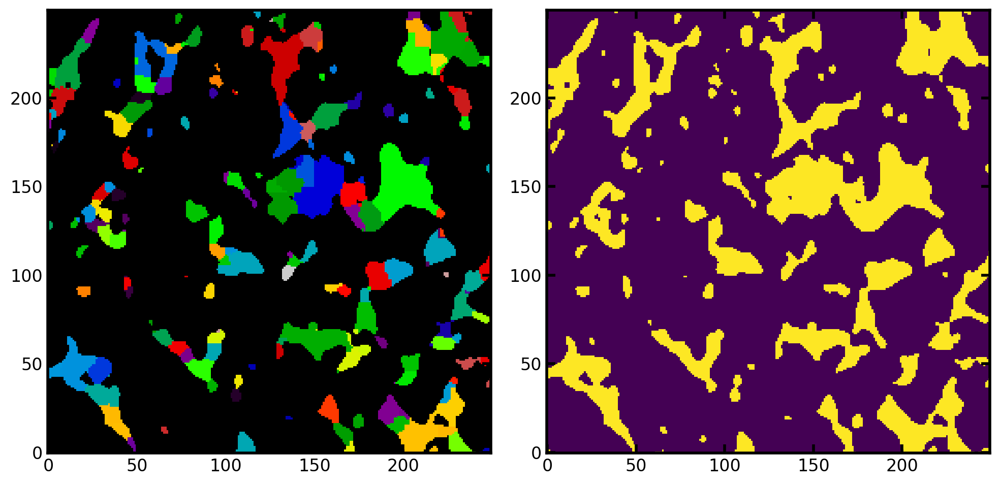

In [ ]:
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.imshow((regions*binary_berea_cut)[:, :, 100], cmap=plt.cm.nipy_spectral)

plt.subplot(1,2,2)
plt.imshow(binary_berea_cut[:, :, 100], cmap='viridis')

Transformar a imagem com a rede de poros segmentada em uma rede

In [ ]:
net = ps.networks.regions_to_network(regions*binary_berea_cut, voxel_size=1)

In [ ]:
pn = op.io.network_from_porespy(net)          #Lendo a rede utilizando a biblioteca OpenPNM

In [ ]:
print(pn)


══════════════════════════════════════════════════════════════════════════════
net : <openpnm.network.Network at 0x7baed7d7a610>
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  #  Properties                                                   Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  2  throat.conns                                                  5585 / 5585
  3  pore.coords                                                   3382 / 3382
  4  pore.region_label                                             3382 / 3382
  5  pore.phase                                                    3382 / 3382
  6  throat.phases                                                 5585 / 5585
  7  pore.region_volume                                            3382 / 3382
  8  pore.equivalent_diameter                                      3382 / 3382
  9  pore.local_peak                                               3382 / 3382
 

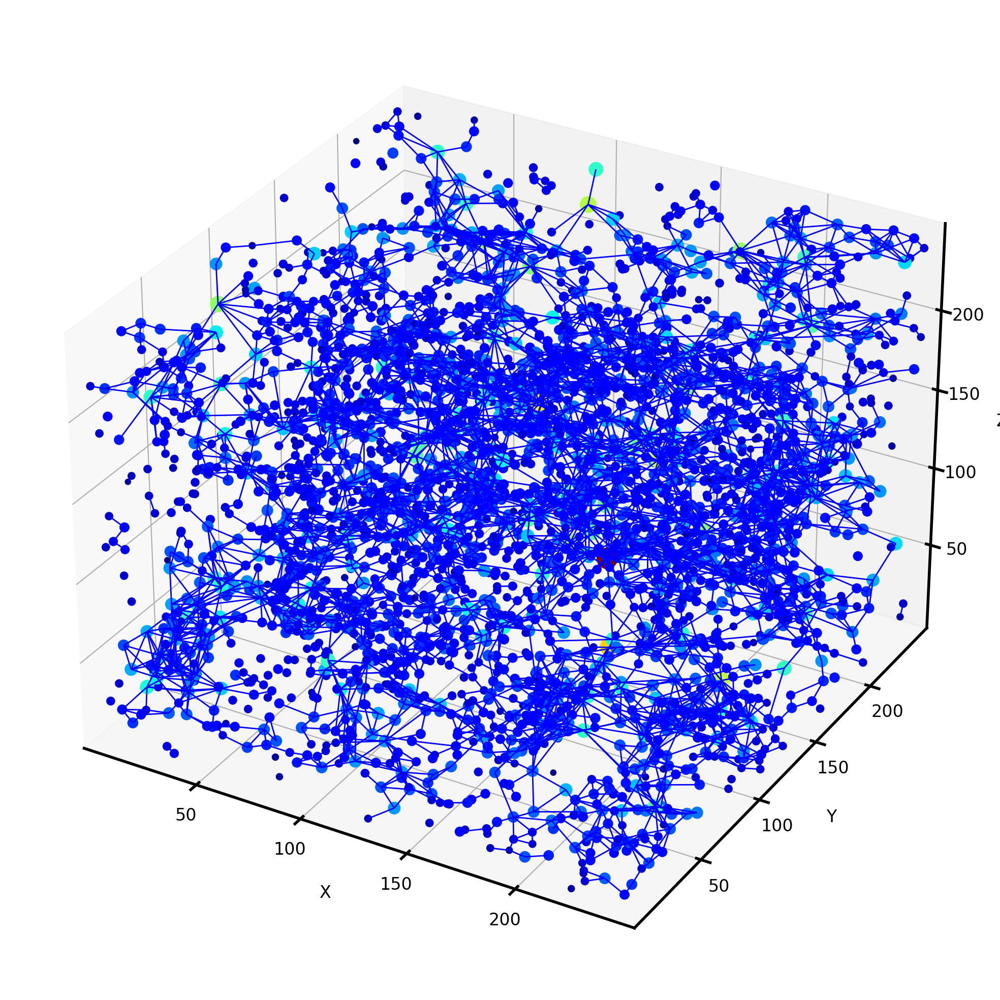

In [ ]:
fig, ax = plt.subplots(figsize=[10, 10])
ax.imshow(binary_berea_cut[:,:,100].T, cmap=plt.cm.bone);
op.visualization.plot_coordinates(ax=fig,
                                  network=pn,
                                  size_by=pn["pore.inscribed_diameter"],
                                  color_by=pn["pore.inscribed_diameter"],
                                  markersize=200)
op.visualization.plot_connections(network=pn, ax=fig)
ax.axis("off");

## Simulação de Drenagem

In [ ]:
#A rede gerada pela lib PoreSpy não retorna a propriedade throat.diameter
#Nesse caso será feita uma aproximação pela proriedade throat.equivalent_diameter
pn['throat.diameter'] = pn['throat.equivalent_diameter']*2.5e-6     #Tamanho do voxel = 2.5um


#A rede gerada também não apresenta a propriedade throat.volume
#Nesse caso, será calculado a partir da área tranversal e do comprimento da garganta de poro
pn['throat.volume'] = pn['throat.cross_sectional_area']*pn['throat.total_length']*(2.5e-6)**3 #Tamanho do voxel = 2.5um

pn['pore.left'] = 0
pn['pore.right'] = 250

In [ ]:
#Modelo de drenagem calculado para fluido=Mercúrio usando o modelo de Washburn

hg = op.phase.Mercury(network=pn)
hg.add_model(propname='throat.entry_pressure', model=op.models.physics.capillary_pressure.washburn)
hg.regenerate_models()
print(hg)


══════════════════════════════════════════════════════════════════════════════
phase_20 : <openpnm.phase.Mercury at 0x7baef3572610>
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  #  Properties                                                   Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  2  pore.temperature                                              3382 / 3382
  3  pore.pressure                                                 3382 / 3382
  4  throat.contact_angle                                          5585 / 5585
  5  pore.thermal_conductivity                                     3382 / 3382
  6  pore.surface_tension                                          3382 / 3382
  7  pore.viscosity                                                3382 / 3382
  8  pore.density                                                  3382 / 3382
  9  pore.molar_density                                            3382 / 338

In [ ]:
mip = op.algorithms.Drainage(network=pn, phase=hg)
mip.set_inlet_BC(pores=pn.pores(['left', 'right']))
mip.run(pressures=np.logspace(4, 6))

Performing drainage simulation:   0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
print(pn)


══════════════════════════════════════════════════════════════════════════════
net : <openpnm.network.Network at 0x7baed7d7a610>
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  #  Properties                                                   Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
  2  throat.conns                                                  5585 / 5585
  3  pore.coords                                                   3382 / 3382
  4  pore.region_label                                             3382 / 3382
  5  pore.phase                                                    3382 / 3382
  6  throat.phases                                                 5585 / 5585
  7  pore.region_volume                                            3382 / 3382
  8  pore.equivalent_diameter                                      3382 / 3382
  9  pore.local_peak                                               3382 / 3382
 

In [ ]:
mip.pc_curve()

pc_curve(pc=array([ 17575.10624855,  19306.97728883,  23299.51810515,  25595.479227  ,
        28117.68697974,  30888.43596477,  33932.21771895,  37275.93720315,
        40949.1506238 ,  44984.32668969,  49417.13361324,  54286.75439324,
        59636.23316595,  65512.85568596,  71968.56730012,  79060.43210908,
        86851.13737514,  95409.547635  , 104811.31341547, 115139.53993264,
       126485.52168553, 138949.54943731, 152641.79671752, 167683.2936811 ,
       184206.99693267, 202358.96477252, 222299.64825262, 244205.30945486,
       268269.57952797, 323745.75428176, 390693.99370546, 568986.60290183,
                   inf]), snwp=array([0.02353035, 0.02767581, 0.03392745, 0.05879738, 0.10500513,
       0.14886958, 0.21160255, 0.28600389, 0.35289648, 0.44520722,
       0.52809485, 0.61743019, 0.68241409, 0.74006795, 0.7918917 ,
       0.83416811, 0.87983967, 0.90067882, 0.91923553, 0.93294638,
       0.94835817, 0.95500159, 0.96155689, 0.96707202, 0.97165316,
       0.97463422, 0.9

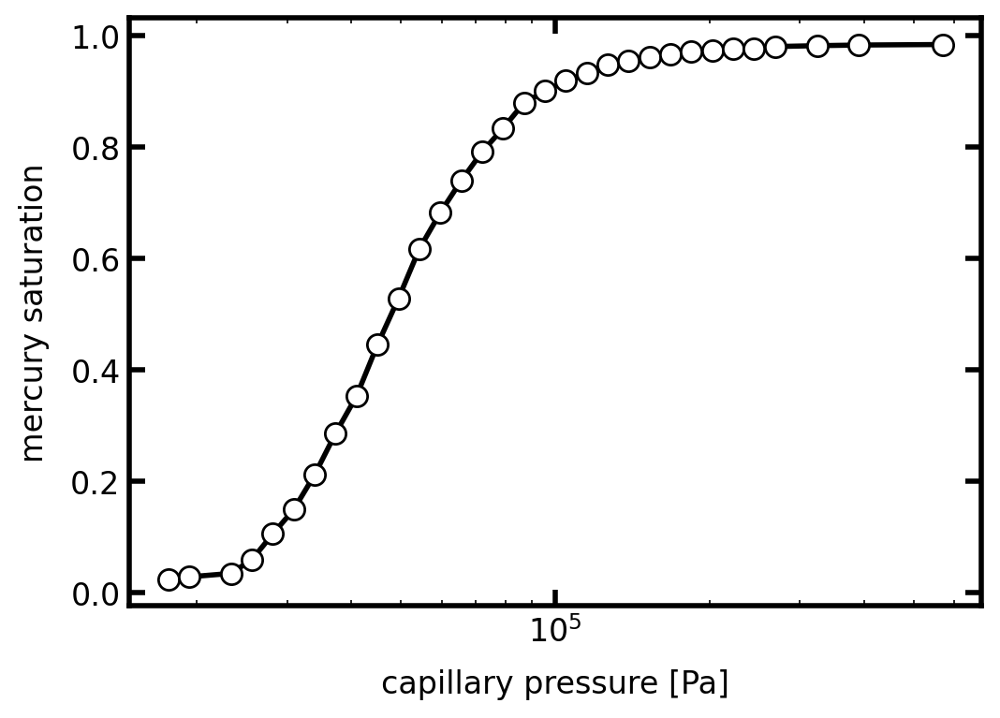

In [ ]:
data = mip.pc_curve()

fig, ax = plt.subplots(figsize=(5.5, 4))
ax.semilogx(data.pc, data.snwp, 'k-o')
ax.set_xlabel('capillary pressure [Pa]')
ax.set_ylabel('mercury saturation')

## Calculando Coeficiente de Permeabilidade

In [ ]:
water = op.phase.Water(network=pn)
water.add_model(propname='throat.hydraulic_conductance',
                model=op.models.physics.hydraulic_conductance.generic_hydraulic)

# Create algorithm, set boundary conditions and run simulation
sf = op.algorithms.StokesFlow(network=pn, phase=water)
Pin, Pout = (200_000, 101_325)
sf.set_value_BC(pores=pn.pores('left'), values=Pin)
sf.set_value_BC(pores=pn.pores('right'), values=Pout)
sf.run()

KeyError: 'throat.hydraulic_size_factors'

# PorePy - Numerical